In [1]:
import numpy as np
import matplotlib.pyplot as plt
import openslide
import cv2 as cv
from define_dataset import define_dataset
from color_distance import color_distance
from color_distance_bins import color_distance_bins
from color_distance_max import color_distance_max
import time

In [2]:
dataset = define_dataset()
tr_set = dataset.tr_set
test_set = dataset.test_set
results_dict = dataset.results_dict
num_positives = dataset.num_positives
num_negatives = dataset.num_negatives

In [10]:
def calculate_ROI_bins(slide_name, level, full_tile_size, base_white, num_bins):
    wsi_path = '../WSI/thesis_WSI/'+slide_name+'/'+slide_name+'.tiff'
    wsi = openslide.OpenSlide(wsi_path)
    
    width_in_tiles = int(wsi.dimensions[0]/full_tile_size)
    height_in_tiles = int(wsi.dimensions[1]/full_tile_size)
    
    level_tile_size = int(full_tile_size/(2**level))

    bins = np.zeros(num_bins)
    for x in range(width_in_tiles):
        print(wsi_path,': col ', x, ' of ', width_in_tiles, end="\r")
        for y in range(height_in_tiles):
            tile = wsi.read_region((x*full_tile_size,y*full_tile_size), level, (level_tile_size,level_tile_size))
            #color distance is normalized in range (0,100)
            bins = np.add(bins,color_distance_bins(tile, base_white, num_bins=num_bins))
    print('\n')
    
    return bins

In [11]:
level = 3
full_tile_size = 512
base_white = [238,238,238]
num_bins = 100

start_time = time.time()
wsi_bins = []

wsi_set=tr_set
for slide_name in wsi_set:
    bins = calculate_ROI_bins(slide_name, level, full_tile_size, base_white, num_bins)
    wsi_bins.append(bins)
    #print(bins)
    #barContainer = plt.bar(x=range(num_bins), height=bins)
    #plt.title(slide_name)
    #plt.show()
    
    
end_time = time.time()
print('time: ', "{:.0f}".format(end_time - start_time))

../WSI/thesis_WSI/19-COMP-004/19-COMP-004.tiff : col  159  of  160

../WSI/thesis_WSI/19-COMP-011/19-COMP-011.tiff : col  107  of  108

../WSI/thesis_WSI/19-COMP-012/19-COMP-012.tiff : col  155  of  156

../WSI/thesis_WSI/19-COMP-014/19-COMP-014.tiff : col  167  of  168

../WSI/thesis_WSI/19-COMP-016/19-COMP-016.tiff : col  167  of  168

../WSI/thesis_WSI/19-COMP-019/19-COMP-019.tiff : col  151  of  152

../WSI/thesis_WSI/19-COMP-029/19-COMP-029.tiff : col  139  of  140

../WSI/thesis_WSI/19-COMP-030/19-COMP-030.tiff : col  183  of  184

../WSI/thesis_WSI/19-COMP-032/19-COMP-032.tiff : col  151  of  152

../WSI/thesis_WSI/19-COMP-034/19-COMP-034.tiff : col  123  of  124

../WSI/thesis_WSI/20-COMP-050/20-COMP-050.tiff : col  115  of  116

../WSI/thesis_WSI/20-COMP-052/20-COMP-052.tiff : col  171  of  172

../WSI/thesis_WSI/20-COMP-054/20-COMP-054.tiff : col  135  of  136

../WSI/thesis_WSI/20-COMP-071/20-COMP-071.tiff : col  107  of  108

../WSI/thesis_WSI/20-COMP-088/20-COMP-088.tiff :

Shows color distance from white histogram

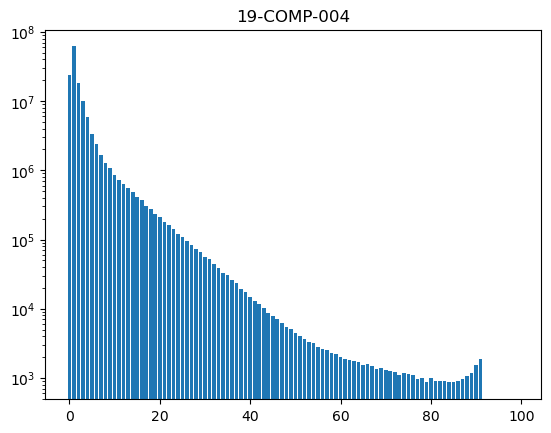

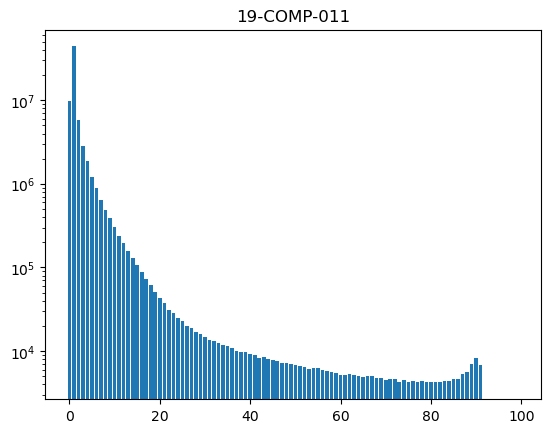

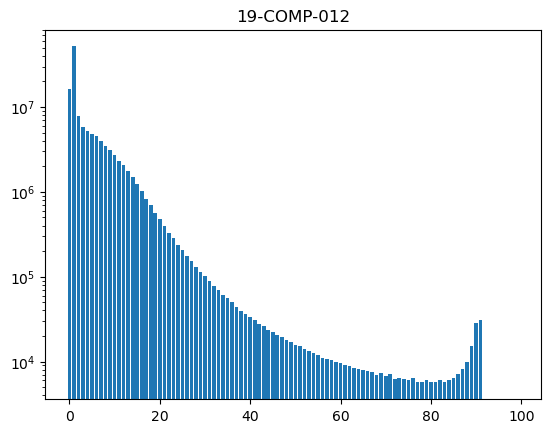

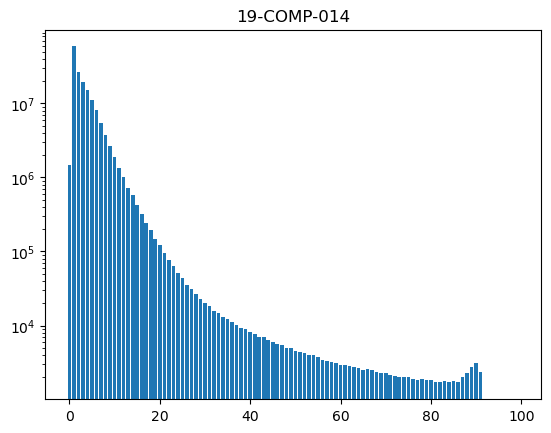

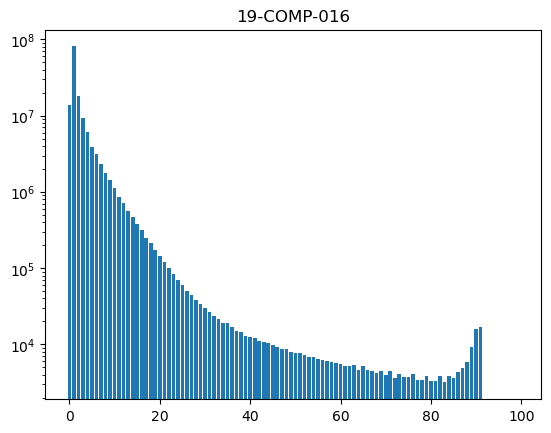

...

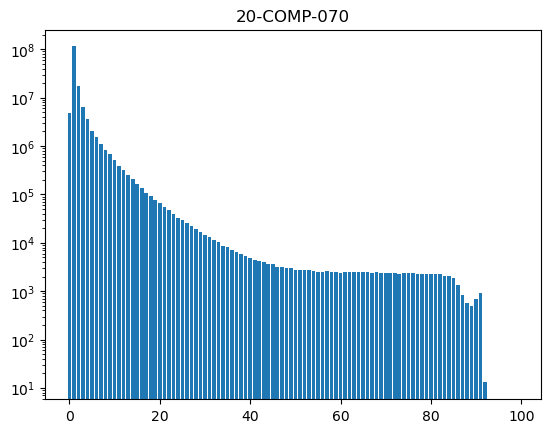

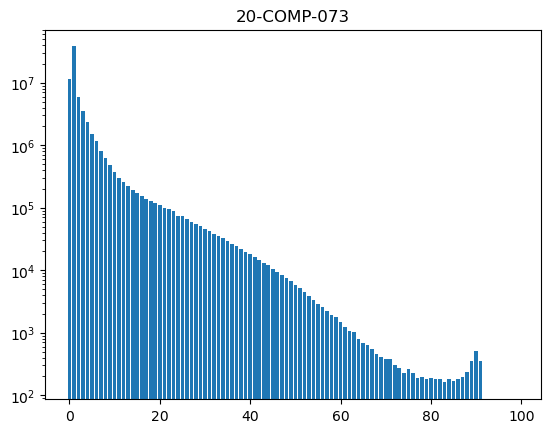

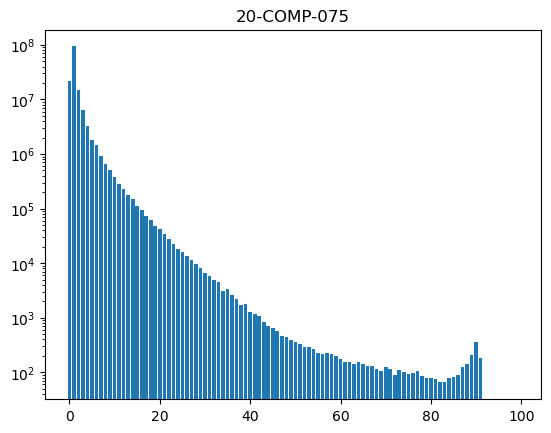

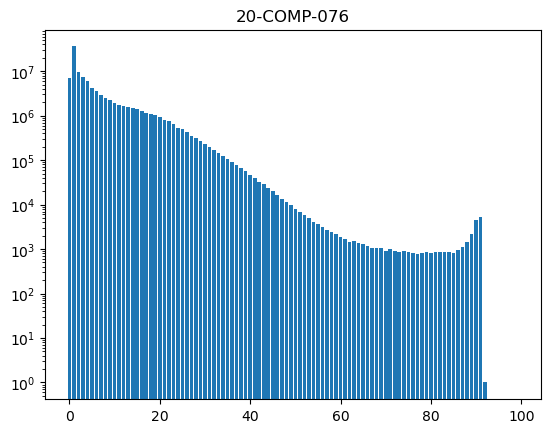

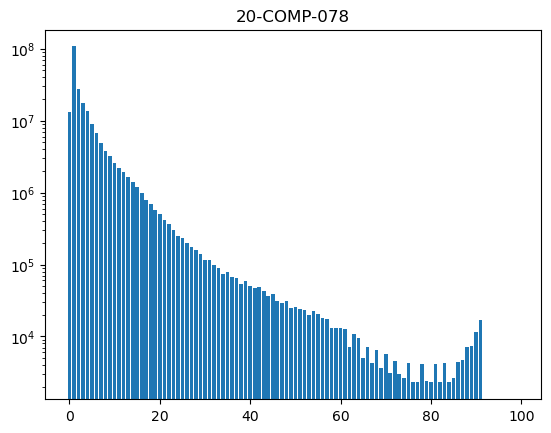

In [29]:
for i, slide_name in enumerate(tr_set):
    fig, ax = plt.subplots()
    barContainer = ax.bar(x=range(num_bins), height=wsi_bins[i])
    plt.title(slide_name)
    std = np.std(wsi_bins[i])
    avg = np.average(wsi_bins[i])

    
    #ax.axhline(y=avg,linewidth=1, color='red')
    #ax.axhline(y=std*1,linewidth=1, color='green')
    #plt.close()
    plt.yscale("log")
    plt.show()

Calculate avg and std of bins and calculate the max distance of each wsi excluding outliers in upper portion of bins

In [12]:
avg = np.average(wsi_bins, axis=0)
std = np.std(wsi_bins, axis=0)
max_bins = np.zeros(len(tr_set), dtype='int')

for i, slide_name in enumerate(tr_set):
    max_bins[i] = num_bins
    #consider outliers bins only in the upper 50%
    for y in range(num_bins-1, 5*(int(num_bins/10))-1, -1):
        if wsi_bins[i][y]> avg[y]+(3*std[y]):
            print(slide_name, "bin", y, "over thresh")
            max_bins[i] = y-1

20-COMP-059 bin 91 over thresh
20-COMP-059 bin 90 over thresh
20-COMP-059 bin 89 over thresh
20-COMP-068 bin 88 over thresh
20-COMP-068 bin 87 over thresh
20-COMP-068 bin 86 over thresh
20-COMP-068 bin 85 over thresh
20-COMP-068 bin 84 over thresh
20-COMP-070 bin 92 over thresh
20-COMP-078 bin 55 over thresh
20-COMP-078 bin 54 over thresh


Calculate max distance from max bin

In [14]:
max_distance = np.zeros(len(tr_set), dtype='int')

for i, slide_name in enumerate(tr_set):
    max_distance[i] = (100/num_bins) * max_bins[i]

In [15]:
np.save('max_distance.npy', max_distance)

In [20]:
print(max_distance)

[100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100 100 100 100 100  88 100 100  83  91 100 100 100  53]


In [17]:
def calculate_ROI(wsi_path, full_tile_size, level, threshold_white, base_white, max_distance):
    wsi = openslide.OpenSlide(wsi_path)
    width_in_tiles = int(wsi.dimensions[0]/full_tile_size)
    height_in_tiles = int(wsi.dimensions[1]/full_tile_size)
    #print('num tiles width', width_in_tiles)
    #print('num tiles heigth', height_in_tiles)
    
    level_tile_size = int(full_tile_size/(2**level))
    ROI_map_arr = np.empty([height_in_tiles, width_in_tiles], dtype=np.single)
    num_tile_pixels = level_tile_size*level_tile_size

    
    for x in range(width_in_tiles):
        print(wsi_path,': col ', x, ' of ', width_in_tiles, end="\r")
        for y in range(height_in_tiles):
            tile = wsi.read_region((x*full_tile_size,y*full_tile_size), level, (level_tile_size,level_tile_size))
            num_white_pixel = color_distance_max(tile, base_white, threshold_white, max_distance=max_distance, num_tile_pixels=num_tile_pixels)
            white_pixel_ratio = num_white_pixel/(tile.size[0]*tile.size[1])
            ROI_map_arr[y][x] = white_pixel_ratio
    return ROI_map_arr

In [18]:
level = 2
threshold_white = 5
#tile size at level 0 (full resolution)
full_tile_size = 256
base_white = [238,238,238]
max_distance = np.load('max_distance.npy')

for i, slide_name in enumerate(tr_set):
    wsi_path = '../WSI/thesis_WSI/'+slide_name+'/'+slide_name+'.tiff'
    ROI_map_arr = calculate_ROI(wsi_path, full_tile_size, level, threshold_white, base_white, max_distance[i])
    np.save('../WSI/thesis_WSI/'+slide_name+'/roi_enhanced.npy', ROI_map_arr)
    print('\n')
    print('completed slide: '+ slide_name)

../WSI/thesis_WSI/19-COMP-004/19-COMP-004.tiff : col  319  of  320

completed slide: 19-COMP-004
../WSI/thesis_WSI/19-COMP-011/19-COMP-011.tiff : col  215  of  216

completed slide: 19-COMP-011
../WSI/thesis_WSI/19-COMP-012/19-COMP-012.tiff : col  311  of  312

completed slide: 19-COMP-012
../WSI/thesis_WSI/19-COMP-014/19-COMP-014.tiff : col  335  of  336

completed slide: 19-COMP-014
../WSI/thesis_WSI/19-COMP-016/19-COMP-016.tiff : col  335  of  336

completed slide: 19-COMP-016
../WSI/thesis_WSI/19-COMP-019/19-COMP-019.tiff : col  303  of  304

completed slide: 19-COMP-019
../WSI/thesis_WSI/19-COMP-029/19-COMP-029.tiff : col  279  of  280

completed slide: 19-COMP-029
../WSI/thesis_WSI/19-COMP-030/19-COMP-030.tiff : col  367  of  368

completed slide: 19-COMP-030
../WSI/thesis_WSI/19-COMP-032/19-COMP-032.tiff : col  303  of  304

completed slide: 19-COMP-032
../WSI/thesis_WSI/19-COMP-034/19-COMP-034.tiff : col  247  of  248

completed slide: 19-COMP-034
../WSI/thesis_WSI/20-COMP-050/

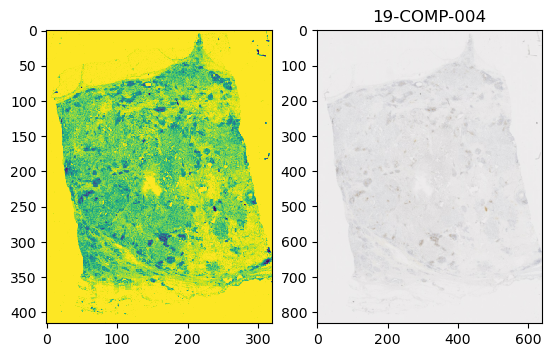

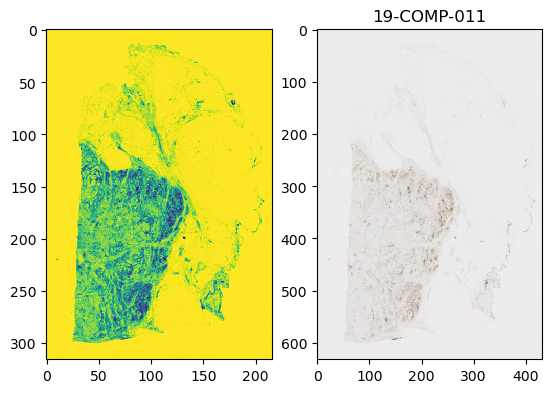

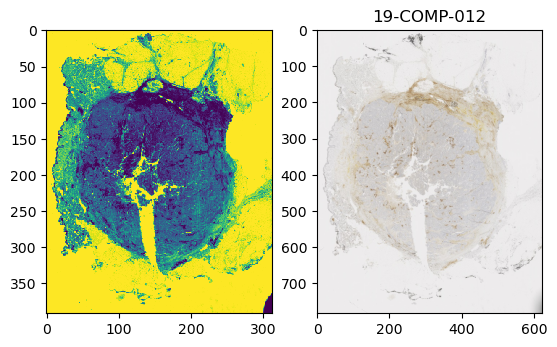

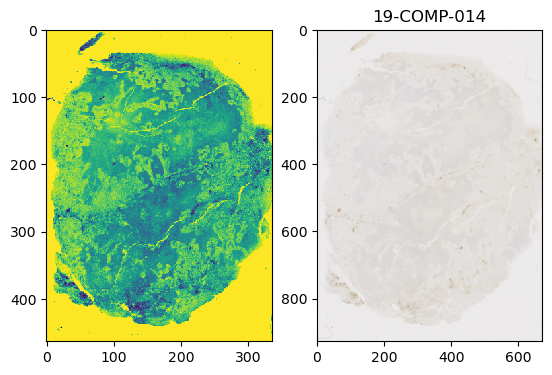

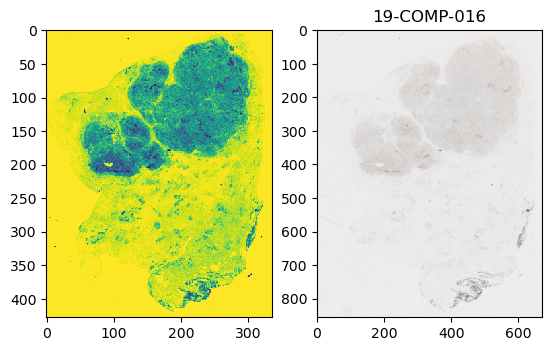

...

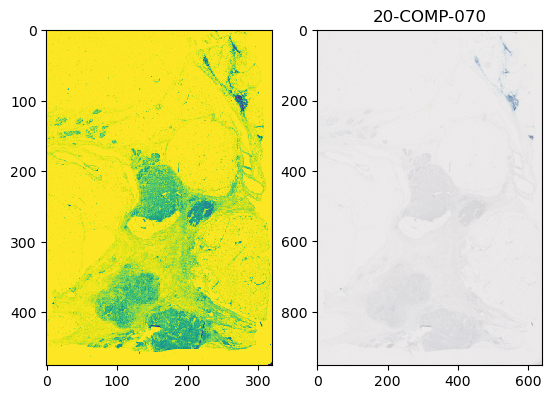

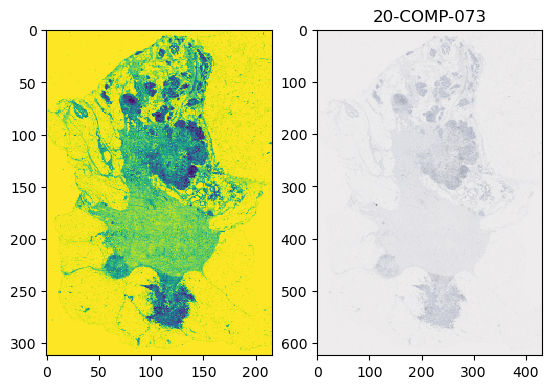

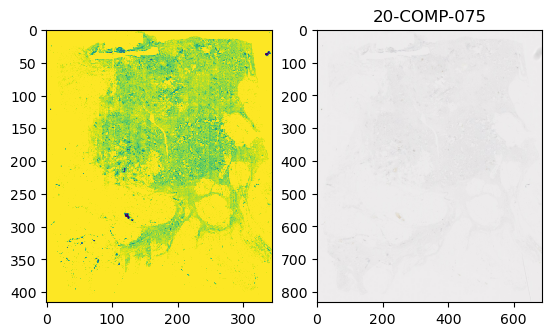

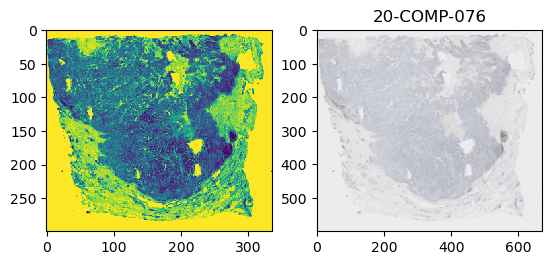

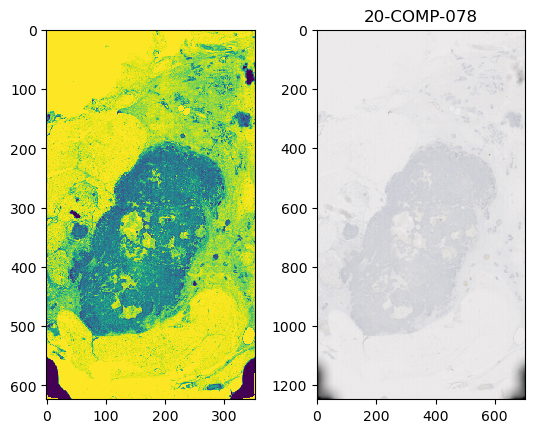

In [19]:
for slide_name in tr_set: 
    wsi_path = '../WSI/thesis_WSI/'+slide_name+'/'+slide_name+'.tiff'
    
    ROI_map_arr = np.load('../WSI/thesis_WSI/'+slide_name+'/roi_enhanced.npy')
    thumbnail = openslide.OpenSlide(wsi_path).get_thumbnail((2*ROI_map_arr.shape[1], 2*ROI_map_arr.shape[0]))
    
    f, couple_im = plt.subplots(1,2)
    couple_im[0].imshow(ROI_map_arr, interpolation='nearest')
    couple_im[1].imshow(thumbnail)


    plt.title(slide_name)

    plt.show()

In [5]:
def exec_closing_opening(threshold_ROI_map):
    kernel = np.ones((3,3), np.uint8)
    
    #removes "holes" in ROI
    img_dilated1 = cv.dilate(threshold_ROI_map, kernel, iterations=1)
    img_eroded1 = cv.erode(img_dilated1, kernel, iterations=1)
    #removes "islands"
    img_eroded2 = cv.erode(img_eroded1, kernel, iterations=1)
    img_dilated2 = cv.dilate(img_eroded2, kernel, iterations=1)
    
    
    return img_dilated2.astype(int)

Apply threshold on normalized ROI, then closing and opening, then save it

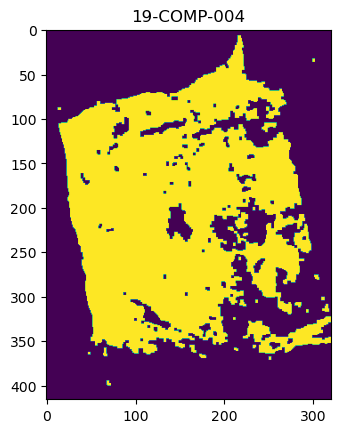

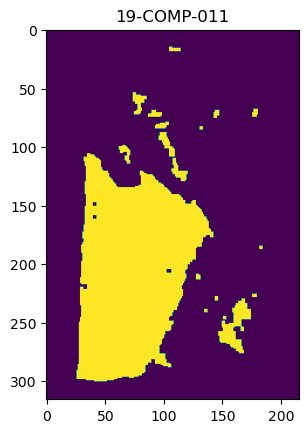

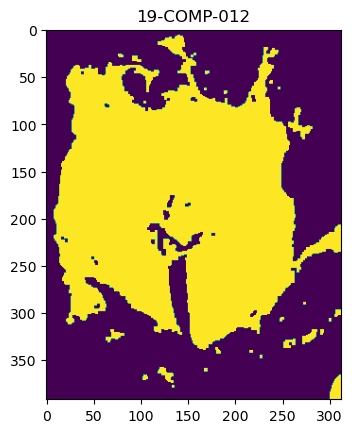

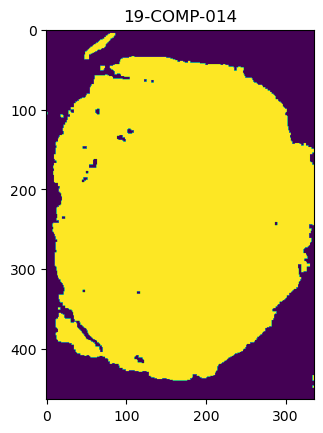

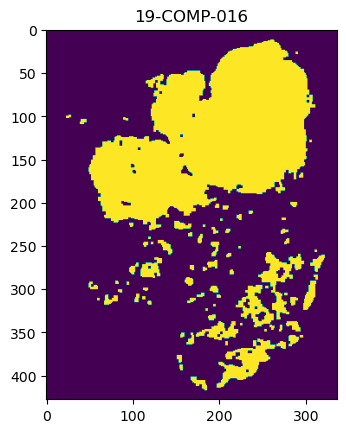

...

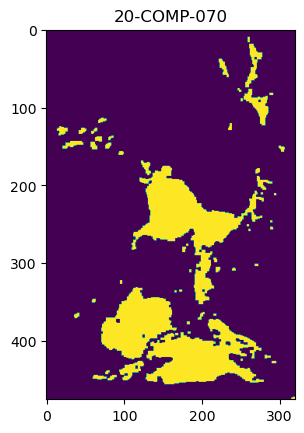

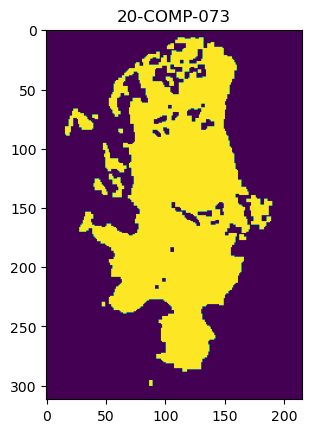

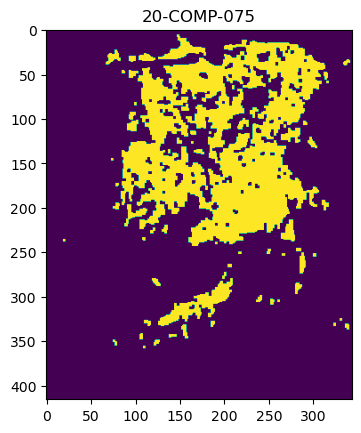

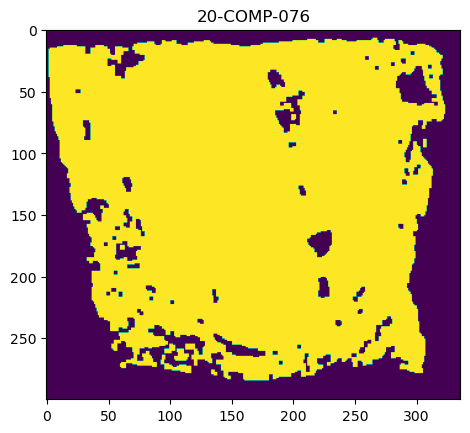

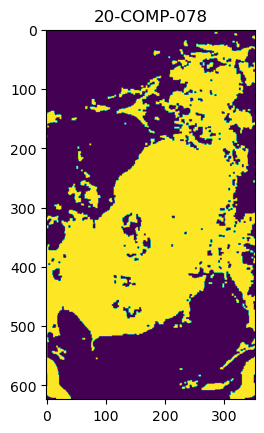

In [26]:
tile_percentage_threshold = 0.95
 
for slide_name in tr_set:
    ROI_map_arr = np.load('../WSI/thesis_WSI/'+slide_name+'/roi_enhanced.npy')
    
    threshold_ROI_map = (ROI_map_arr<tile_percentage_threshold).astype(float)     
    ROI_map_op_cl = exec_closing_opening(threshold_ROI_map)
    np.save('../WSI/thesis_WSI/'+slide_name+'/roi_'+str(tile_percentage_threshold)+'_enhanced.npy', ROI_map_op_cl)

Show ROI map array after opening and closing with a certain threshold

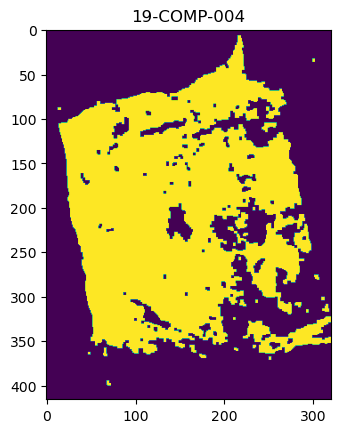

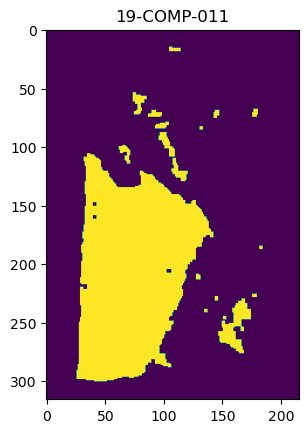

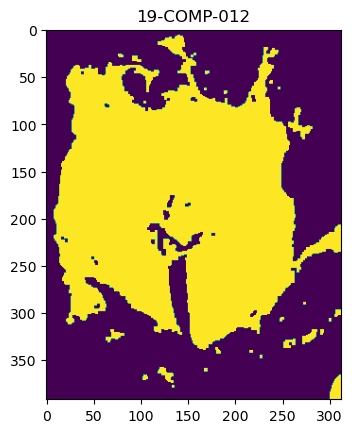

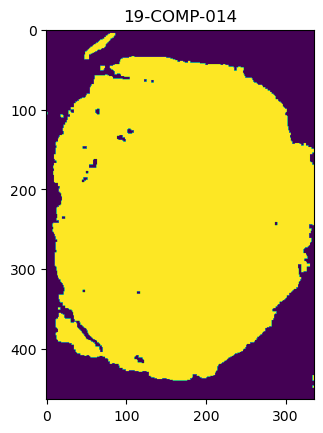

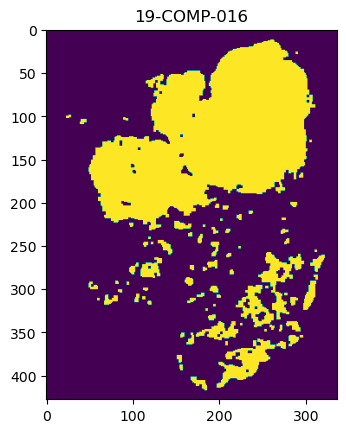

...

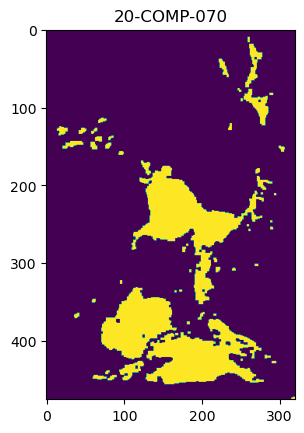

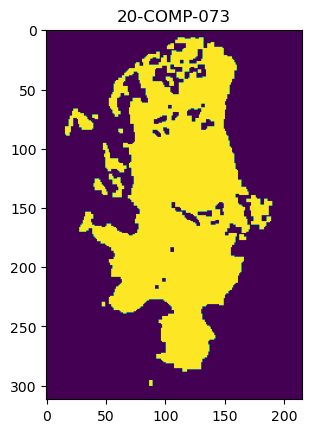

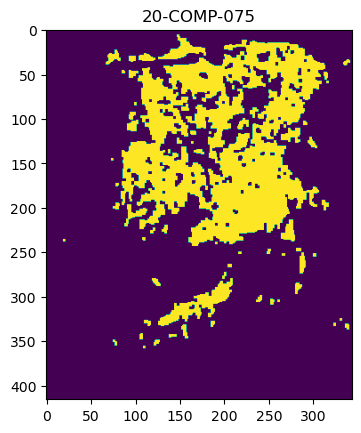

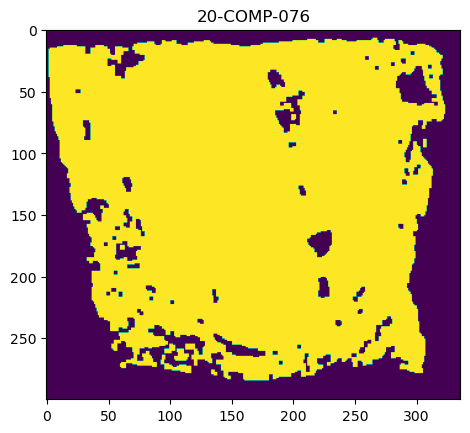

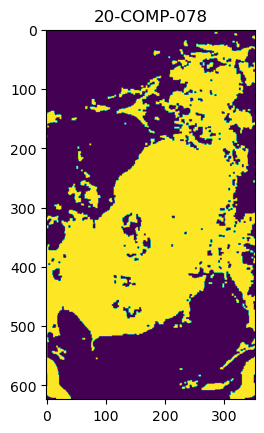

In [4]:
tile_percentage_threshold = 0.95

for slide_name in tr_set:
    ROI_map_op_cl = np.load('../WSI/thesis_WSI/'+slide_name+'/roi_'+str(tile_percentage_threshold)+'_enhanced.npy')
    plt.imshow(ROI_map_op_cl)
    plt.title(slide_name)
    plt.show()

Test set

In [31]:
level = 3
full_tile_size = 512
base_white = [238,238,238]
num_bins = 100

start_time = time.time()
wsi_bins = []

wsi_set=test_set
for slide_name in wsi_set:
    bins = calculate_ROI_bins(slide_name, level, full_tile_size, base_white, num_bins)
    wsi_bins.append(bins)
    
end_time = time.time()
print('time: ', "{:.0f}".format(end_time - start_time))

../WSI/thesis_WSI/20-COMP-077/20-COMP-077.tiff : col  147  of  148

../WSI/thesis_WSI/20-COMP-065/20-COMP-065.tiff : col  163  of  164

../WSI/thesis_WSI/19-COMP-039/19-COMP-039.tiff : col  167  of  168

../WSI/thesis_WSI/20-COMP-102/20-COMP-102.tiff : col  123  of  124

../WSI/thesis_WSI/19-COMP-037/19-COMP-037.tiff : col  151  of  152

../WSI/thesis_WSI/19-COMP-026/19-COMP-026.tiff : col  147  of  148

time:  676


Shows ROI float array map and original wsi from test set

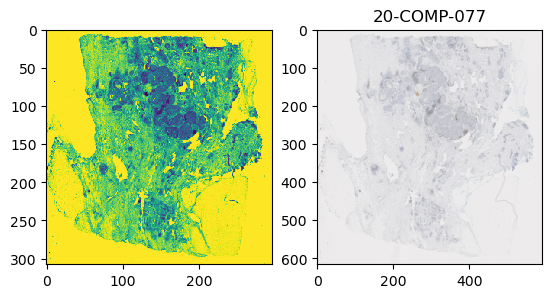

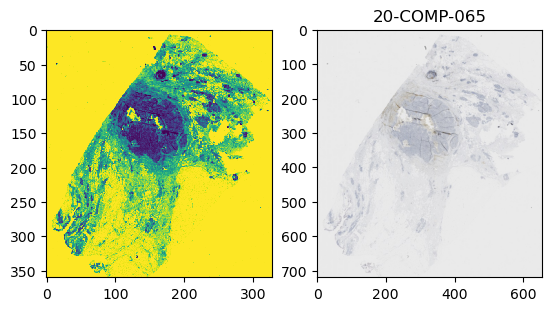

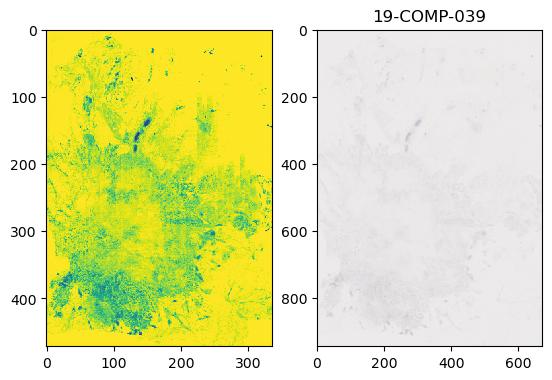

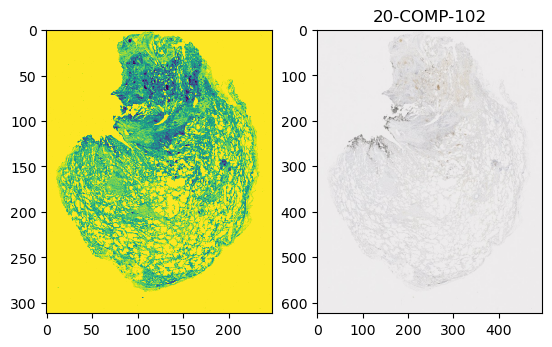

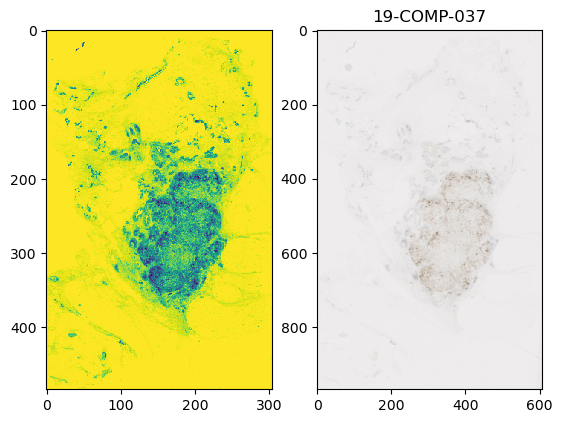

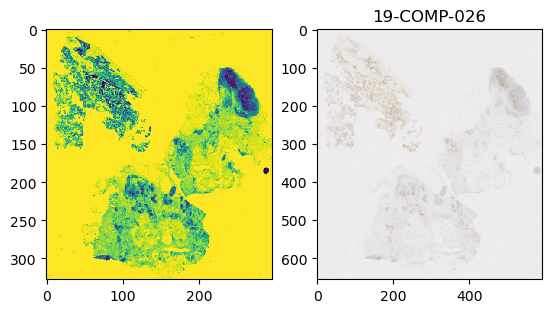

In [3]:
for slide_name in test_set: 
    wsi_path = '../WSI/thesis_WSI/'+slide_name+'/'+slide_name+'.tiff'
    
    ROI_map_arr = np.load('../WSI/thesis_WSI/'+slide_name+'/roi_enhanced.npy')
    thumbnail = openslide.OpenSlide(wsi_path).get_thumbnail((2*ROI_map_arr.shape[1], 2*ROI_map_arr.shape[0]))
    
    f, couple_im = plt.subplots(1,2)
    couple_im[0].imshow(ROI_map_arr, interpolation='nearest')
    couple_im[1].imshow(thumbnail)


    plt.title(slide_name)

    plt.show()

In [32]:
avg = np.average(wsi_bins, axis=0)
std = np.std(wsi_bins, axis=0)
max_bins = np.zeros(len(tr_set), dtype='int')

for i, slide_name in enumerate(test_set):
    max_bins[i] = num_bins
    #consider outliers bins only in the upper 50%
    for y in range(num_bins-1, 5*(int(num_bins/10))-1, -1):
        if wsi_bins[i][y]> avg[y]+(3*std[y]):
            print(slide_name, "bin", y, "over thresh")
            max_bins[i] = y-1
            
np.save('max_distance_test.npy', max_distance)

In [33]:
level = 2
threshold_white = 5
#tile size at level 0 (full resolution)
full_tile_size = 256
base_white = [238,238,238]
max_distance = np.load('max_distance_test.npy')

for i, slide_name in enumerate(test_set):
    wsi_path = '../WSI/thesis_WSI/'+slide_name+'/'+slide_name+'.tiff'
    ROI_map_arr = calculate_ROI(wsi_path, full_tile_size, level, threshold_white, base_white, max_distance[i])
    np.save('../WSI/thesis_WSI/'+slide_name+'/roi_enhanced.npy', ROI_map_arr)
    print('\n')
    print('completed slide: '+ slide_name)

../WSI/thesis_WSI/20-COMP-077/20-COMP-077.tiff : col  295  of  296

completed slide: 20-COMP-077
../WSI/thesis_WSI/20-COMP-065/20-COMP-065.tiff : col  327  of  328

completed slide: 20-COMP-065
../WSI/thesis_WSI/19-COMP-039/19-COMP-039.tiff : col  335  of  336

completed slide: 19-COMP-039
../WSI/thesis_WSI/20-COMP-102/20-COMP-102.tiff : col  247  of  248

completed slide: 20-COMP-102
../WSI/thesis_WSI/19-COMP-037/19-COMP-037.tiff : col  303  of  304

completed slide: 19-COMP-037
../WSI/thesis_WSI/19-COMP-026/19-COMP-026.tiff : col  295  of  296

completed slide: 19-COMP-026


In [1]:
tile_percentage_threshold = 0.95
 
for slide_name in test_set:
    ROI_map_arr = np.load('../WSI/thesis_WSI/'+slide_name+'/roi_enhanced.npy')
    
    threshold_ROI_map = (ROI_map_arr<tile_percentage_threshold).astype(float)     
    ROI_map_op_cl = exec_closing_opening(threshold_ROI_map)
    np.save('../WSI/thesis_WSI/'+slide_name+'/roi_'+str(tile_percentage_threshold)+'_enhanced.npy', ROI_map_op_cl)

    plt.imshow(ROI_map_op_cl)
    plt.title(slide_name)
    plt.show()

NameError: name 'test_set' is not defined